In [136]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
import librosa
import librosa.display
import noisereduce
from scipy.signal import butter, filtfilt

Loading audio file with sample rate set that networks were trained on 
***(fill in the path parameter)***

In [ ]:
data, sr = librosa.load(path = "sample/audio_file/path", sr = 16000)

**Audio** before cleaning

In [154]:
Audio(data = data, rate = sr)

**Plot** of audio signal before cleaning

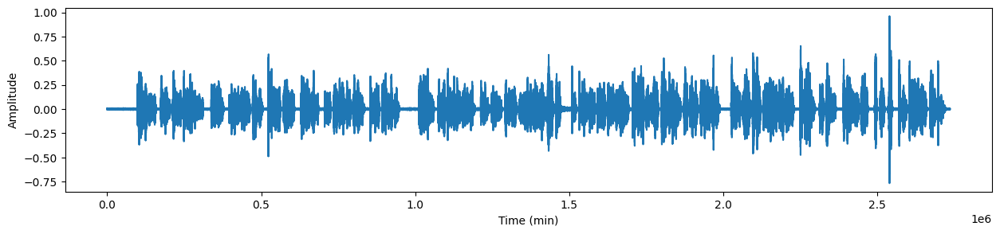

In [155]:
fig, ax = plt.subplots(figsize=(15,3))
ax.set(xlabel='Time (min)', ylabel='Amplitude')
ax.plot(data)
plt.show()

**Denoising**
1. We are using RMS to find optimal segments with noise, so we could use spectral gating filtering for optimal noise reduction.
2. If it's not possible we use band-stop filter to eliminate low frequency noise often encountered on the street or humming created by electric devices.

In [156]:
# Example variables
lowcut = 100
highcut = 1000
order = 4
RMS_percentile = 25

rms = librosa.feature.rms(y = data)[0]
threshold = np.percentile(rms, RMS_percentile)
noise_indices = np.where(rms < threshold)[0]

if len(noise_indices) > 0:
    noise_sample = data[noise_indices[0]*512 : noise_indices[0]*512 + int(sr * 2)]
    reduced_noise = noisereduce.reduce_noise(y = data, sr = sr, y_noise = noise_sample)
else:
    nyquist = 0.5 * sr
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype = 'bandstop', analog = False)
    reduced_noise = filtfilt(b, a, data)

**Plot** of cleaned audio signal

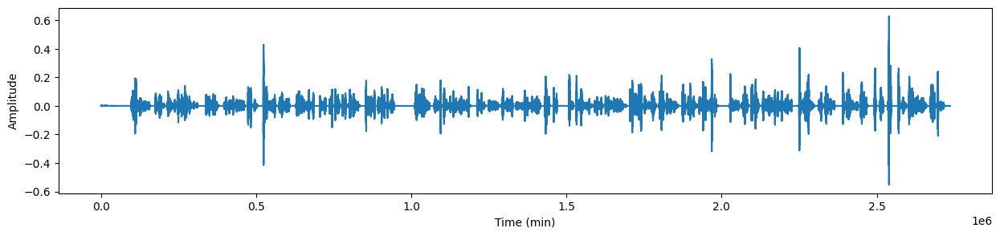

In [157]:
fig, ax = plt.subplots(figsize=(15,3))
ax.set(xlabel='Time (min)', ylabel='Amplitude')
ax.plot(reduced_noise)
plt.show()

**Audio** after cleaning

In [158]:
Audio(data = reduced_noise, rate = sr)